In [15]:
using FourierFlows, PyPlot
using FFTW
using Statistics
using LinearAlgebra: mul!, ldiv!
parsevalsum = FourierFlows.parsevalsum

parsevalsum (generic function with 1 method)

# Negative Damping
Consider if we do the time evolution of NS equation in the fourier space, we can write it as:

$$\frac{\partial \hat{u_i}}{\partial t} = i\hat{P} - k^2 \hat{u_i} - iku_i u_j + \hat{f}$$

One of the choice for $\hat{f}$ could be Nagetive damping, where we can write $\hat{f}$ as:

$$
\hat{f} = \left\{ \begin{array}{rcl}
\varepsilon_W/2/E_f \hat{u_i} & \mbox{if}
\:\:0 < |k| < k_f \\ 0  & otherwise
\end{array}\right.
$$

The energy input for the force function could be found by working on the work spectrum

$$
\int dk W(k,t) = \int dk \: 4\pi k^2 \: <\widehat{u_i(-k,t)}\widehat{f_i(k,t)} > \\
              = \frac{\varepsilon_W}{E_f} \int^{k_f}_0 dk\:4\pi k^2 1/2 <\widehat{u_i(-k,t)}\widehat{u_i(k,t)}>\\
              = \frac{\varepsilon_W}{E_f} \int^{k_f}_0 dk \: E(k,t) = \varepsilon_W
$$

# Initial field generation 
One should be careful for the initial conidtion of the velocity field in the study of the turbulent system. We should pick a IC such that it is similar in form to a developed flow. To do this, we follow the PhD thesis from Samuel Robert Yoffe, generating a random gaussian field. The actual implement could be found in https://garrettgoon.com/gaussian-fields/ 


The below shows an implementation of gaussian-fields using julia

In [2]:
function GetGaussianFields2D(N,n)
    NoiseField = randn(div(N,2),div(N,2));
    NoiseField = randn(N,N);
    #With μ = 0, σ^2 = 1
    print("μ = ",mean(NoiseField),", σ^2 = ",var(NoiseField));
    NF_k = fftshift(fft(NoiseField));
    
    Φ_ab = copy(NF_k);

    nx,ny= size(NF_k)
    #Φ_ab[1:nx       , 1:ny       ] .= @view NF_k[1:nx   , 1:ny ];
    #Φ_ab[1:nx       , end:-1:ny+1] .= @view NF_k[1:nx   , 1:ny ];
    #Φ_ab[nx+1:end   , 1:ny       ] .= @view NF_k[nx:-1:1, 1:ny ];
    #Φ_ab[end:-1:nx+1, end:-1:ny+1] .= @view NF_k[1:nx   , 1:ny ];
    
    ∑P_k = 0
    for j ∈ 1:N, i ∈ 1:N
        kx = i - div(N,2);
        ky = j - div(N,2);
        k  = √(kx^2+ky^2);
        P_k = sqrt(ifelse(k==0,0,k^n));
        ∑P_k += P_k
        Φ_ab[i,j] *= P_k;
    end
    return real(ifft(fftshift(Φ_ab))/∑P_k)
end

function GetGaussianFields3D(N,n)
    NoiseField = randn(N,N,N);
    #With μ = 0, σ^2 = 1
    println("μ = ",mean(NoiseField),", σ^2 = ",var(NoiseField));
    NF_k = fftshift(fft(NoiseField));
    
    Φ_ab = copy(NF_k);
    ∑P_k = 0
    
    for k ∈ 1:N, j ∈ 1:N, i ∈ 1:N
        kx = i - div(N,2);
        ky = j - div(N,2);
        kz = k - div(N,2);
        kk  = √(kx^2+ky^2+kz^2);
        P_k = sqrt(ifelse(kk==0,0,kk^n));
        ∑P_k += P_k
        Φ_ab[i,j,k] = Φ_ab[i,j,k]*P_k;
    end
    return real(ifft(fftshift(Φ_ab)))
end

GetGaussianFields3D (generic function with 1 method)

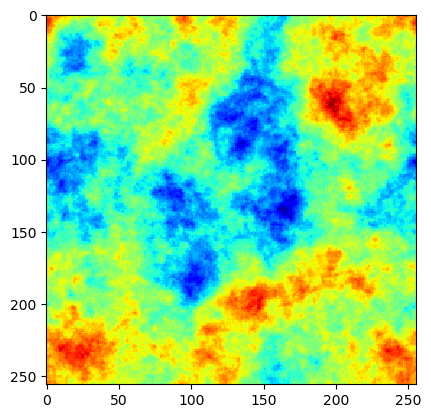

μ = -0.008018556423970268, σ^2 = 0.9948408079627794

In [20]:
N = 256
n = -3
Φ_ab = GetGaussianFields2D(N,n);
imshow(Φ_ab,cmap="jet");

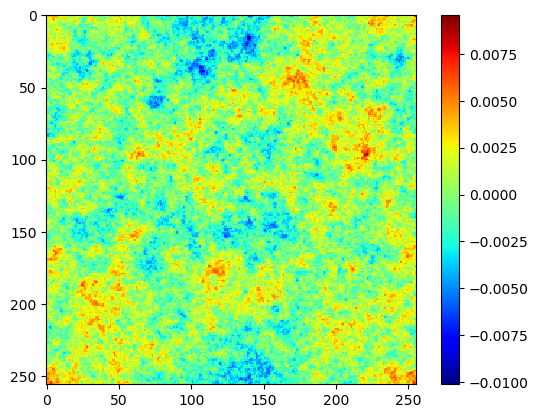

μ = 0.0002657215038609514, σ^2 = 0.9993622612784443


PyObject <matplotlib.colorbar.Colorbar object at 0x7f09e522cc18>

In [21]:
N = 256;
n =  -3;
Φ_ab = GetGaussianFields3D(N,n);
imshow(Φ_ab[20,:,:],cmap="jet");
colorbar()

In [3]:
function updatevars!(prob)
  vars, grid, sol, params = prob.vars, prob.grid, prob.sol, prob.params
  
  dealias!(sol, grid)
  
  #Update V + B Fourier Conponment
  @. vars.uxh = sol[:, :, :, params.ux_ind];
  @. vars.uyh = sol[:, :, :, params.uy_ind];
  @. vars.uzh = sol[:, :, :, params.uz_ind];
    
  @. vars.bxh = sol[:, :, :, params.bx_ind];
  @. vars.byh = sol[:, :, :, params.by_ind];
  @. vars.bzh = sol[:, :, :, params.bz_ind];

  #Update V + B Real Conponment
  ldiv!(vars.ux, grid.rfftplan, deepcopy(vars.uxh)) # deepcopy() since inverse real-fft destroys its input
  ldiv!(vars.uy, grid.rfftplan, deepcopy(vars.uyh)) # deepcopy() since inverse real-fft destroys its input
  ldiv!(vars.uz, grid.rfftplan, deepcopy(vars.uzh)) # deepcopy() since inverse real-fft destroys its input
  ldiv!(vars.bx, grid.rfftplan, deepcopy(vars.bxh)) # deepcopy() since inverse real-fft destroys its input
  ldiv!(vars.by, grid.rfftplan, deepcopy(vars.byh)) # deepcopy() since inverse real-fft destroys its input
  ldiv!(vars.bz, grid.rfftplan, deepcopy(vars.bzh)) # deepcopy() since inverse real-fft destroys its input
  
  return nothing
end

updatevars! (generic function with 1 method)

In [16]:
function ProblemTurbulence(dev::Device=CPU();
  # Numerical parameters
                nx = 64,
                ny = nx,
                nz = nx,
                Lx = 2π,
                Ly = Lx,
                Lz = Lx,
   # Drag and/or hyper-viscosity for velocity/B-field
                 ν = 0,
                nν = 1,
                 η = 0,
  # Timestepper and equation options
                dt = 0.01,
           stepper = "RK4",
  # Forcing parameter
                kf = 12.5,
  # Float type and dealiasing
                 T = Float64)

  grid = ThreeDGrid(dev, nx, Lx, ny, Ly, nz, Lz; T=T)

  kernel = Getkernel(grid,kf);
    
  params = Params{T}(ν, η, nν, kernel, 1, 2, 3, 4, 5, 6)

  vars = SetVars(dev, grid);

  equation = Equation_with_forcing(dev, params, grid)

  return FourierFlows.Problem(equation, stepper, dt, grid, vars, params, dev)
end



#const SetVars = Vars{<:AbstractArray, <:AbstractArray}
function SetVars(::Dev, grid::AbstractGrid) where Dev
  T = eltype(grid)
    
  @devzeros Dev T (grid.nx, grid.ny, grid.nz) ux  uy  uz  bx  by bz nonlin1 nonlin2
  @devzeros Dev Complex{T} (grid.nkr, grid.nm, grid.nl) uxh uyh uzh bxh byh bzh nonlinh1 nonlinh2
  
  return Vars( ux,  uy,  uz,  bx,  by,  bz,
              uxh, uyh, uzh, bxh, byh, bzh,
              nonlin1, nonlinh1, nonlin2, nonlinh2);
end

function Equation_with_forcing(dev,params::Params, grid::AbstractGrid)
  #Do the linear term calcution, but not required in the testing part.
  T = eltype(grid)
  L = zeros(dev, T, (grid.nkr,grid.nm,grid.nk, 6));
  #@. L =  - params.η * grid.kr^2
    
  return FourierFlows.Equation(L,calcN_with_forcing!, grid)
end
function calcN_with_forcing!(N, sol, t, clock, vars, params, grid)
  dealias!(sol, grid)
  
  calcN_advection!(N, sol, t, clock, vars, params, grid)
    
  AddForce!(N, sol, t, clock, vars, params, grid)
  
  return nothing
end

calcN_with_forcing! (generic function with 1 method)

In [17]:
# 1:Nx/2, 2:Ny, 3:Nz
δ(a::Int,b::Int) = ( a == b ? 1 : 0 );
function Ux_Update!(N, sol, t, clock, vars, params, grid)
    
  α     = 1;
  k_α   = grid.kr;
  invk2 = grid.invKrsq;
  u_ih  = vars.uxh;
  ∂u_ih∂t = @view N[:,:,:,params.ux_ind];
  @. ∂u_ih∂t*= 0;

  for (b_i,u_i,k_i) ∈ zip([vars.bx,vars.by,vars.bz],[vars.ux,vars.uy,vars.uz],[grid.kr,grid.l,grid.m])
        for (b_j,u_j,k_j,j) ∈ zip([vars.bx,vars.by,vars.bz],[vars.ux,vars.uy,vars.uz],[grid.kr,grid.l,grid.m],[1, 2, 3])
            # Initialization 
            @. vars.nonlin1 *= 0;
            @. vars.nonlin2 *= 0;
            ui_uj  = vars.nonlin1;    
            bi_bj  = vars.nonlin2; 
            ui_ujh = vars.nonlinh1;
            bi_bjh = vars.nonlinh2;
            
            # Pre-Calculation in Real Space
            @. ui_uj = u_i*u_j;
            @. bi_bj = b_i*b_j;
            
            # Fourier transform 
            mul!(ui_ujh, grid.rfftplan, ui_uj);
            mul!(bi_bjh, grid.rfftplan, bi_bj);
            
            #preform the actual calculation
            # this line has bugsssssssssssssssssssssssssssssss
            @. ∂u_ih∂t += -im*k_i*(δ(α,j)-k_α*k_j*invk2)*(ui_ujh-bi_bjh);
            
        end
    end
    
    #Compute the diffusion term  - νk^2 u_i
    @. ∂u_ih∂t += -grid.Krsq*params.ν*u_ih;
    return nothing
    
end

function Uy_Update!(N, sol, t, clock, vars, params, grid)
    
  α     = 2;
  k_α   = grid.l;
  invk2 = grid.invKrsq;
  u_ih  = vars.uyh;
  ∂u_ih∂t = @view N[:,:,:,params.uy_ind];
  @. ∂u_ih∂t*= 0;
  
  for (b_i,u_i,k_i) ∈ zip([vars.bx,vars.by,vars.bz],[vars.ux,vars.uy,vars.uz],[grid.kr,grid.l,grid.m])
        for (b_j,u_j,k_j,j) ∈ zip([vars.bx,vars.by,vars.bz],[vars.ux,vars.uy,vars.uz],[grid.kr,grid.l,grid.m],[1, 2, 3])
            
            # Initialization 
            @. vars.nonlin1 *= 0;
            @. vars.nonlin2 *= 0;
            ui_uj  = vars.nonlin1;    
            bi_bj  = vars.nonlin2; 
            ui_ujh = vars.nonlinh1;
            bi_bjh = vars.nonlinh2;
            
            # Pre-Calculation in Real Space
            @. ui_uj = u_i*u_j;
            @. bi_bj = b_i*b_j;
            
            # Fourier transform 
            mul!(ui_ujh, grid.rfftplan, ui_uj);
            mul!(bi_bjh, grid.rfftplan, bi_bj);
            
            #preform the actual calculation
            # this line has bugsssssssssssssssssssssssssssssss
            @. ∂u_ih∂t += -im*k_i*(δ(α,j)-k_α*k_j*invk2)*(ui_ujh-bi_bjh);
            
        end
    end 
    
    #Compute the diffusion term  - νk^2 u_i
    @. ∂u_ih∂t += -grid.Krsq*params.ν*u_ih;
    return nothing
    
end

function Uz_Update!(N, sol, t, clock, vars, params, grid)
    
  α     = 3;
  k_α   = grid.m;
  invk2 = grid.invKrsq;
  u_ih  = vars.uzh;
  ∂u_ih∂t = @view N[:,:,:,params.uz_ind];
  @. ∂u_ih∂t*= 0;

  for (b_i,u_i,k_i) ∈ zip([vars.bx,vars.by,vars.bz],[vars.ux,vars.uy,vars.uz],[grid.kr,grid.l,grid.m])
        for (b_j,u_j,k_j,j) ∈ zip([vars.bx,vars.by,vars.bz],[vars.ux,vars.uy,vars.uz],[grid.kr,grid.l,grid.m],[1, 2, 3])
            
            # Initialization 
            @. vars.nonlin1 *= 0;
            @. vars.nonlin2 *= 0;
            ui_uj  = vars.nonlin1;    
            bi_bj  = vars.nonlin2; 
            ui_ujh = vars.nonlinh1;
            bi_bjh = vars.nonlinh2;
            
            # Pre-Calculation in Real Space
            @. ui_uj = u_i*u_j;
            @. bi_bj = b_i*b_j;
            
            # Fourier transform 
            mul!(ui_ujh, grid.rfftplan, ui_uj);
            mul!(bi_bjh, grid.rfftplan, bi_bj);
            
            #preform the actual calculation
            # this line has bugsssssssssssssssssssssssssssssss
            @. ∂u_ih∂t += -im*k_i*(δ(α,j)-k_α*k_j*invk2)*(ui_ujh-bi_bjh);
            
        end
    end
    
    #Compute the diffusion term  F(∂u∂t) = - ν k^2 u_i, F(∇^2 vec(U)) => k^2
    @. ∂u_ih∂t += -grid.Krsq*params.ν*u_ih;
    return nothing
    
end


Uz_Update! (generic function with 1 method)

In [18]:
function Bx_Update!(N, sol, t, clock, vars, params, grid)
    
    #To Update B_i, we have two terms:
    # ∂B_i/∂t = im ∑_j k_j*(b_iu_j - u_ib_j)  - η k^2 B_i
    #We split two terms for sparating the computation.
    u_i  = vars.ux;
    b_i  = vars.bx; 
    b_ih = vars.bxh; 
    ∂B_ih∂t = @view N[:,:,:,params.bx_ind];
    @. ∂B_ih∂t*= 0;
    
    #Compute the first term, im ∑_j k_j*(b_iu_j - u_ib_j)
    for (b_j,u_j,k_j) ∈ zip([vars.bx,vars.by,vars.bz],[vars.ux,vars.uy,vars.uz],[grid.kr,grid.l,grid.m])
        # Initialization 
        @. vars.nonlin1 *= 0;
        @. vars.nonlin2 *= 0;
        ui_bj  = vars.nonlin1;    
        bi_uj  = vars.nonlin2; 
        ui_bjh = vars.nonlinh1;
        bi_ujh = vars.nonlinh2;
        
        # Actual Calculation in Real Space
        @. ui_bj = u_i*b_j;
        @. bi_uj = b_i*u_j;

        # Fourier transform back to spectral space
        mul!(ui_bjh, grid.rfftplan, ui_bj);
        mul!(bi_ujh, grid.rfftplan, bi_uj);
        
        @. ∂B_ih∂t += -im*k_j*(bi_ujh - ui_bjh);
    end
    
    #Compute the diffusion term  - ηk^2 B_i
    @. ∂B_ih∂t += -grid.Krsq*params.η*b_ih;
    
    return nothing

end


function By_Update!(N, sol, t, clock, vars, params, grid)
    
    #To Update B_i, we have two terms:
    # ∂B_i/∂t = im ∑_j k_j*(b_iu_j - u_ib_j)  - η k^2 B_i
    #We split two terms for sparating the computation.
    u_i  = vars.uy;
    b_i  = vars.by; 
    b_ih = vars.byh; 
    ∂B_ih∂t = @view N[:,:,:,params.by_ind];
    @. ∂B_ih∂t*= 0;
    
    #Compute the first term, im ∑_j k_j*(b_iu_j - u_ib_j)
    for (b_j,u_j,k_j) ∈ zip([vars.bx,vars.by,vars.bz],[vars.ux,vars.uy,vars.uz],[grid.kr,grid.l,grid.m])
        # Initialization 
        @. vars.nonlin1 *= 0;
        @. vars.nonlin2 *= 0;
        ui_bj  = vars.nonlin1;    
        bi_uj  = vars.nonlin2; 
        ui_bjh = vars.nonlinh1;
        bi_ujh = vars.nonlinh2;
        
        # Actual Calculation in Real Space
        @. ui_bj = u_i*b_j;
        @. bi_uj = b_i*u_j;

        # Fourier transform back to spectral space
        mul!(ui_bjh, grid.rfftplan, ui_bj);
        mul!(bi_ujh, grid.rfftplan, bi_uj);
        
        @. ∂B_ih∂t += -im*k_j*(bi_ujh - ui_bjh);
    end
    
    #Compute the diffusion term  - ηk^2 B_i
    @. ∂B_ih∂t += -grid.Krsq*params.η*b_ih;
    
    return nothing

end

function Bz_Update!(N, sol, t, clock, vars, params, grid)
    
    #To Update B_i, we have two terms:
    # ∂B_i/∂t = im ∑_j k_j*(b_iu_j - u_ib_j)  - η k^2 B_i
    #We split two terms for sparating the computation.
    u_i  = vars.uz;
    b_i  = vars.bz; 
    b_ih = vars.bzh; 
    ∂B_ih∂t = @view N[:,:,:,params.bz_ind];
    @. ∂B_ih∂t*= 0;
    
    #Compute the first term, im ∑_j k_j*(b_iu_j - u_ib_j)
    for (b_j,u_j,k_j) ∈ zip([vars.bx,vars.by,vars.bz],[vars.ux,vars.uy,vars.uz],[grid.kr,grid.l,grid.m])
        # Initialization 
        @. vars.nonlin1 *= 0;
        @. vars.nonlin2 *= 0;
        ui_bj  = vars.nonlin1;    
        bi_uj  = vars.nonlin2; 
        ui_bjh = vars.nonlinh1;
        bi_ujh = vars.nonlinh2;
        
        # Actual Calculation in Real Space
        @. ui_bj = u_i*b_j;
        @. bi_uj = b_i*u_j;

        # Fourier transform back to spectral space
        mul!(ui_bjh, grid.rfftplan, ui_bj);
        mul!(bi_ujh, grid.rfftplan, bi_uj);
        
        @. ∂B_ih∂t += -im*k_j*(bi_ujh - ui_bjh);
    end
    
    #Compute the diffusion term  - ηk^2 B_i
    @. ∂B_ih∂t += -grid.Krsq*params.η*b_ih;
    
    return nothing

end


Bz_Update! (generic function with 1 method)

In [19]:
function AddForce!(N, sol, t, clock, vars, params, grid)
    
    ux_ind,uy_ind,uz_ind = params.ux_ind,params.uy_ind,params.uz_ind;
    Ek_in_kf = CalEinKf(prob);
    ϵ_w      = 100;
    
    
    for (ui_ind,u_ih) ∈ zip([ux_ind,uy_ind,uz_ind]
                            ,[vars.uxh,vars.uyh,vars.uzh])

        ∂u_ih∂t  = @view N[:,:,:,ui_ind];

        #Compute the diffusion term  - ηk^2 B_i
        @. ∂u_ih∂t += grid.invKrsq*params.kernel/4π*ϵ_w/Ek_in_kf/2*u_ih;
    end
    return nothing

end


function calcN_advection!(N, sol, t, clock, vars, params, grid)
  #Update V + B Fourier Conponment
  @. vars.uxh = sol[:, :, :, params.ux_ind];
  @. vars.uyh = sol[:, :, :, params.uy_ind];
  @. vars.uzh = sol[:, :, :, params.uz_ind];
    
  @. vars.bxh = sol[:, :, :, params.bx_ind];
  @. vars.byh = sol[:, :, :, params.by_ind];
  @. vars.bzh = sol[:, :, :, params.bz_ind];

  #Update V + B Real Conponment
  ldiv!(vars.ux, grid.rfftplan, deepcopy(vars.uxh))
  ldiv!(vars.uy, grid.rfftplan, deepcopy(vars.uyh))
  ldiv!(vars.uz, grid.rfftplan, deepcopy(vars.uzh))
  ldiv!(vars.bx, grid.rfftplan, deepcopy(vars.bxh))
  ldiv!(vars.by, grid.rfftplan, deepcopy(vars.byh))
  ldiv!(vars.bz, grid.rfftplan, deepcopy(vars.bzh))  
  
  #Update V Advection
  Ux_Update!(N, sol, t, clock, vars, params, grid)  
  Uy_Update!(N, sol, t, clock, vars, params, grid)
  Uz_Update!(N, sol, t, clock, vars, params, grid)
  
  #Update B Advection  
  Bx_Update!(N, sol, t, clock, vars, params, grid)
  By_Update!(N, sol, t, clock, vars, params, grid)
  Bz_Update!(N, sol, t, clock, vars, params, grid)
  
  return nothing
end

calcN_advection! (generic function with 1 method)

In [20]:
abstract type ThreeDMHDVars <: AbstractVars end
struct Vars{Aphys, Atrans} <: ThreeDMHDVars
    "x-component of velocity"
        ux :: Aphys
    "y-component of velocity"
        uy :: Aphys
    "z-component of velocity"
        uz :: Aphys
    "x-component of B-field"
        bx :: Aphys
    "y-component of B-field"
        by :: Aphys
    "z-component of B-field"
        bz :: Aphys
    "Fourier transform of x-component of velocity"
       uxh :: Atrans
    "Fourier transform of y-component of velocity"
       uyh :: Atrans
    "Fourier transform of z-component of velocity"
       uzh :: Atrans
    "Fourier transform of x-component of B-field"
       bxh :: Atrans
    "Fourier transform of y-component of B-field"
       byh :: Atrans
    "Fourier transform of z-component of B-field"
       bzh :: Atrans

    "Non-linear term 1"
     nonlin1 :: Aphys
    "Fourier transform of Non-linear term"
    nonlinh1 :: Atrans
    "Non-linear term 2"
     nonlin2 :: Aphys
    "Fourier transform of Non-linear term"
    nonlinh2 :: Atrans
    

end

struct Params{T} <: AbstractParams
    
    "small-scale (hyper)-viscosity coefficient for v"
       ν :: T
    "small-scale (hyper)-viscosity coefficient fro b"
       η :: T
    "(hyper)-viscosity order, `nν```≥ 1``"
      nν :: Int
    
    "Kernal for computing turbulence Forcing"
   kernel:: Array
    
    "Array Indexing for velocity"
  ux_ind :: Int
  uy_ind :: Int
  uz_ind :: Int
    
    "Array Indexing for B-field"
  bx_ind :: Int
  by_ind :: Int
  bz_ind :: Int
    
end

In [21]:
function ProblemGenerator!(prob,L,N,n)
  println("N = ",N,",L = ",L)
  ux = GetGaussianFields3D(N,n);
  uy = GetGaussianFields3D(N,n);
  uz = GetGaussianFields3D(N,n);
    
  bx = GetGaussianFields3D(N,n);
  by = GetGaussianFields3D(N,n);
  bz = GetGaussianFields3D(N,n);
    
    
  #Update V + B Fourier Conponment
  uxh = @view prob.sol[:, :, :, prob.params.ux_ind];
  uyh = @view prob.sol[:, :, :, prob.params.uy_ind];
  uzh = @view prob.sol[:, :, :, prob.params.uz_ind];
    
  bxh = @view prob.sol[:, :, :, prob.params.bx_ind];
  byh = @view prob.sol[:, :, :, prob.params.by_ind];
  bzh = @view prob.sol[:, :, :, prob.params.bz_ind];

  mul!(uxh, prob.grid.rfftplan, ux);   
  mul!(uyh, prob.grid.rfftplan, uy);
  mul!(uzh, prob.grid.rfftplan, uz);
  mul!(bxh, prob.grid.rfftplan, bx);
  mul!(byh, prob.grid.rfftplan, by);
  mul!(bzh, prob.grid.rfftplan, bz);
  
  
  updatevars!(prob)
    
  return nothing
end

ProblemGenerator! (generic function with 1 method)

In [22]:
n = 128;
L = 2π;
prob  = ProblemTurbulence(CPU();
  # Numerical parameters
                nx = n,
                Lx = 2π,
  # Drag and/or hyper-viscosity for velocity/B-field
                 ν = 1e-4,
                nν = 1,
                 η = 1e-4,
  # Timestepper and equation options
                dt = 0.1,
           stepper = "RK4",
  # Forcing parameter
                kf = 12.5,
  # Float type and dealiasing
                 T = Float64)
ProblemGenerator!(prob,L,n,-2)
u2,b2 = GetEnergy(prob);

N = 128,L = 6.283185307179586
μ = 0.001788387424256936, σ^2 = 0.9994166550923722
μ = 0.000386145947525873, σ^2 = 1.0008431239529303
μ = 0.0012317493140488862, σ^2 = 1.0003123947620998
μ = 7.350886578430017e-7, σ^2 = 0.9985763574856985
μ = 0.000849853121374287, σ^2 = 1.0003240804998896
μ = -0.00022354329515316865, σ^2 = 0.9994830611881728


In [23]:
function CalEinKf(prob)
    Ekh = prob.vars.nonlinh1;
    @. Ekh = 0;
    @. Ekh = -prob.vars.uxh.*prob.vars.uxh + 
             -prob.vars.uyh.*prob.vars.uyh +
             -prob.vars.uzh.*prob.vars.uzh ;
    @. Ekh  *= prob.params.kernel;
    Ek_in_kf = sum(Ekh)*prob.grid.Lx/2;
    return Ek_in_kf
end

function Getkernel(grid,kf::Number)
  N = grid.nx;
  kernel = copy(grid.Krsq);
  kernel[grid.Krsq.>=kf^2] .= 0;
  kernel[grid.Krsq.<=1] .= 0;
  return kernel*4*π
end
#Ek_in_kf = CalEinKf(prob)

Getkernel (generic function with 1 method)

In [24]:
sr(A) = round(A,digits=2);
sr(A) = round(A,digits=2);
function GetEnergy(prob)
    bx,by,bz = prob.vars.bx,prob.vars.by,prob.vars.bz;
    vx,vy,vz = prob.vars.ux,prob.vars.uy,prob.vars.uz;
    KE = sum(vx.^2+vy.^2 + vz.^2);
    ME = sum(bx.^2+by.^2 + bz.^2);
    #println("KE = ",sr(KE),", x=",sr(sum(vx.^2)),", y=",sr(sum(vy.^2)),", z=",sr(sum(vz.^2)));
    #println("ME = ",sr(ME),", x=",sr(sum(bx.^2)),", y=",sr(sum(by.^2)),", z=",sr(sum(bz.^2)));
    return KE,ME
end

GetEnergy (generic function with 1 method)

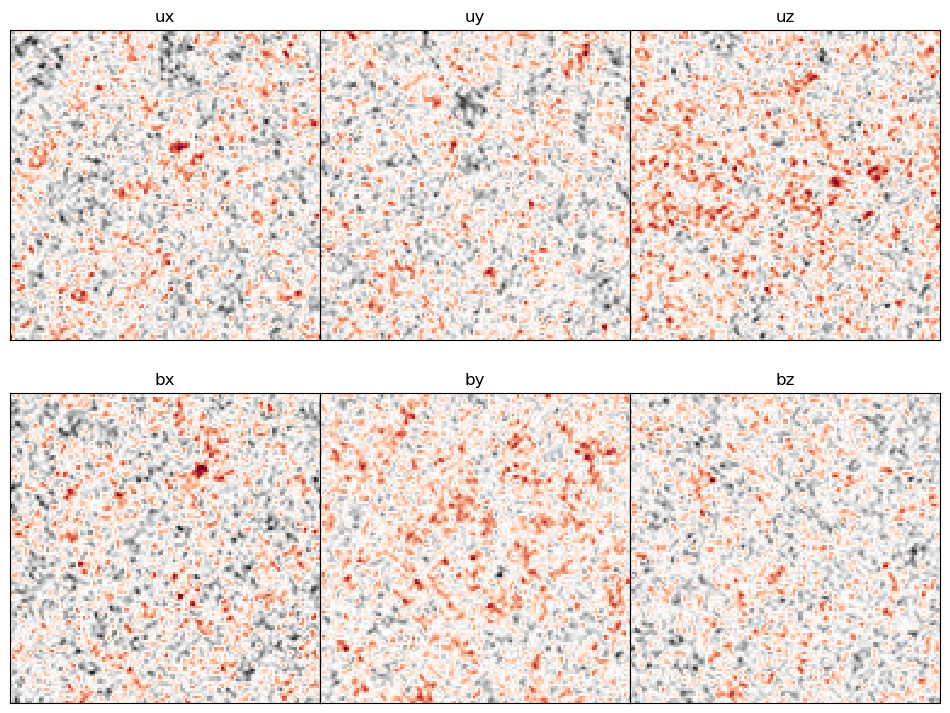

In [25]:
function plotfigure(prob,j)
figure(figsize=(12,9))
ax = subplot(231)
imshow(prob.vars.ux[:,:,1],cmap="RdGy_r");
ax.xaxis.set_ticks_position("none");ax.yaxis.set_ticks_position("none")
ax.set_yticklabels([]);ax.set_xticklabels([]);title("ux")
ax = subplot(232)
imshow(prob.vars.uy[:,:,1],cmap="RdGy_r");
ax.xaxis.set_ticks_position("none");ax.yaxis.set_ticks_position("none")
ax.set_yticklabels([]);ax.set_xticklabels([]);title("uy")
ax = subplot(233)
imshow(prob.vars.uz[:,:,1],cmap="RdGy_r");
ax.xaxis.set_ticks_position("none");ax.yaxis.set_ticks_position("none")
ax.set_yticklabels([]);ax.set_xticklabels([]);title("uz")
ax = subplot(234)
imshow(prob.vars.bx[:,:,1],cmap="RdGy_r");
ax.xaxis.set_ticks_position("none");ax.yaxis.set_ticks_position("none")
ax.set_yticklabels([]);ax.set_xticklabels([]);title("bx")
ax = subplot(235)
imshow(prob.vars.by[:,:,1],cmap="RdGy_r");
ax.xaxis.set_ticks_position("none");ax.yaxis.set_ticks_position("none")
ax.set_yticklabels([]);ax.set_xticklabels([]);title("by")
ax=subplot(236)
imshow(prob.vars.bz[:,:,1],cmap="RdGy_r");
ax.xaxis.set_ticks_position("none");ax.yaxis.set_ticks_position("none")
ax.set_yticklabels([]);ax.set_xticklabels([]);title("bz")
subplots_adjust(wspace=0.00, hspace=0.1);
savefig("GIF/$j.png")
end
plotfigure(prob,1)

n cycle = 10,KE = 0.0008894707403632302ME = 0.0008562926972620335
n cycle = 20,KE = 0.0010175383145026137ME = 0.0009392699959186775
n cycle = 30,KE = 0.001146246879966836ME = 0.0010272624186473218
n cycle = 40,KE = 0.0012327906641466742ME = 0.0010908392604608583
n cycle = 50,KE = 0.0012726179924726763ME = 0.0011238910311402212
n cycle = 60,KE = 0.0012741452462131063ME = 0.0011277305371668249
n cycle = 70,KE = 0.0012486336487085603ME = 0.001108263665537438
n cycle = 80,KE = 0.0012057033774318274ME = 0.0010734472177648799
n cycle = 90,KE = 0.0011527736387587383ME = 0.0010304513788762498
n cycle = 100,KE = 0.001096040410721465ME = 0.0009837921498540075
n cycle = 110,KE = 0.0010396547293769058ME = 0.0009364720548508527
n cycle = 120,KE = 0.000985594478311116ME = 0.0008906109591549397
n cycle = 130,KE = 0.0009350909212814166ME = 0.0008474757280741048
n cycle = 140,KE = 0.000888652327502606ME = 0.0008076824360662153
n cycle = 150,KE = 0.0008462234700650079ME = 0.0007714396348235915
n cycle =

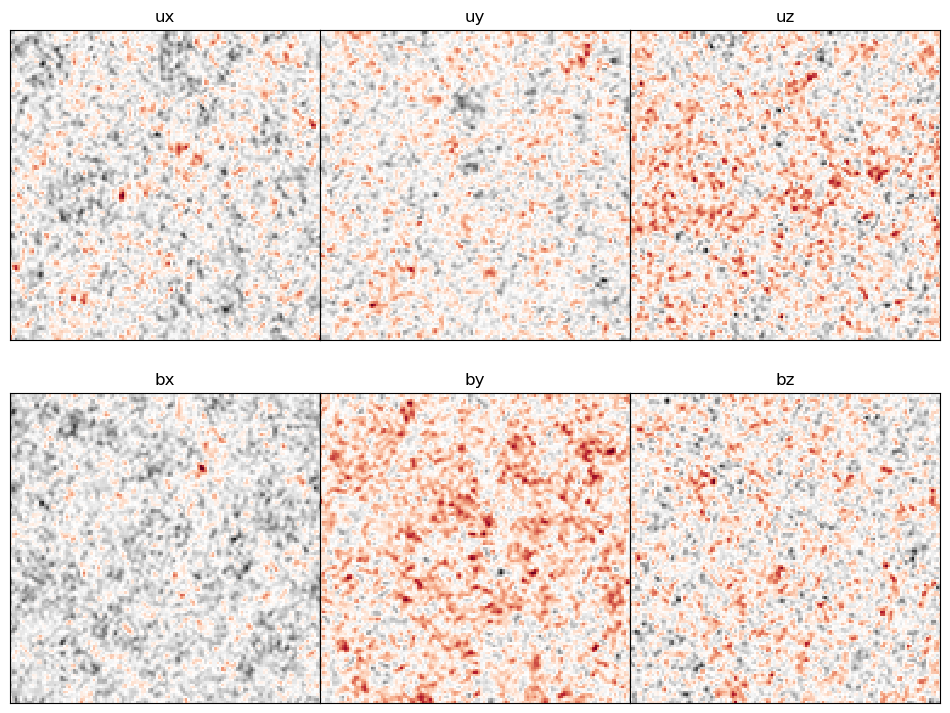

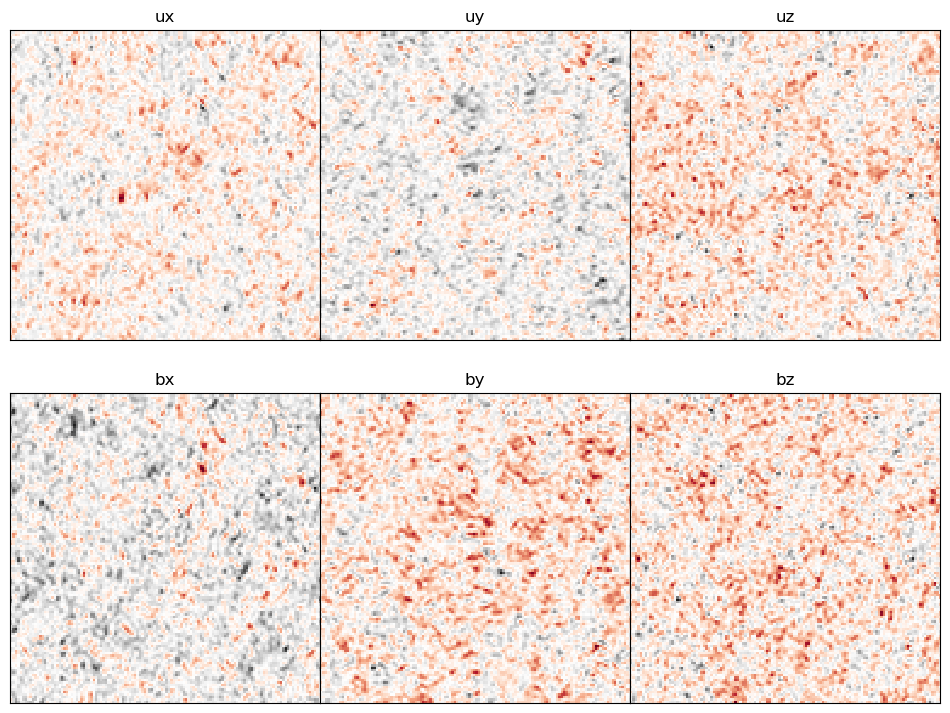

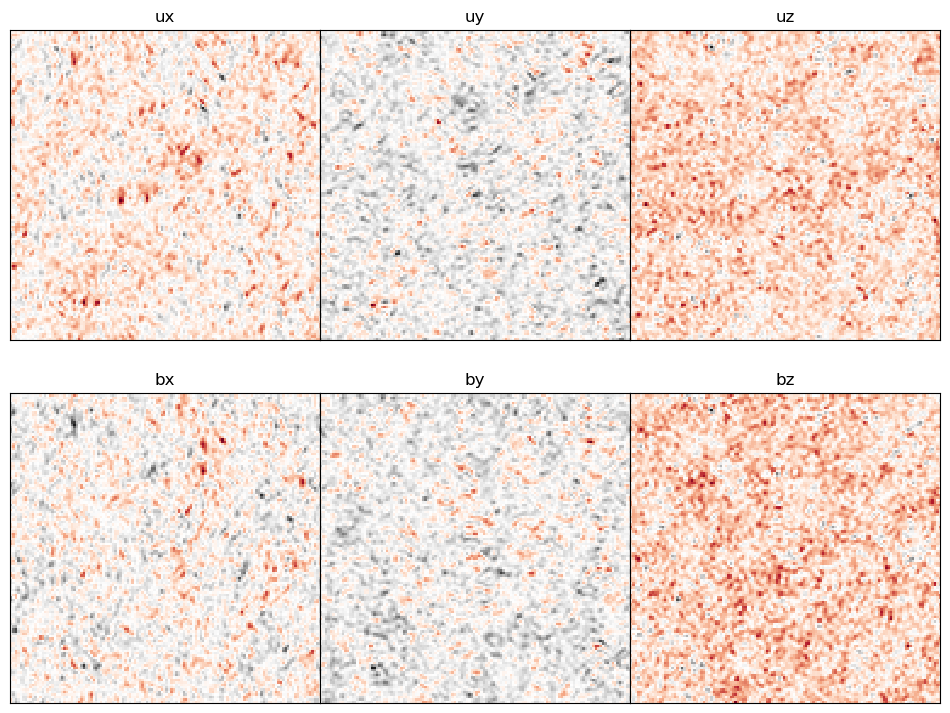

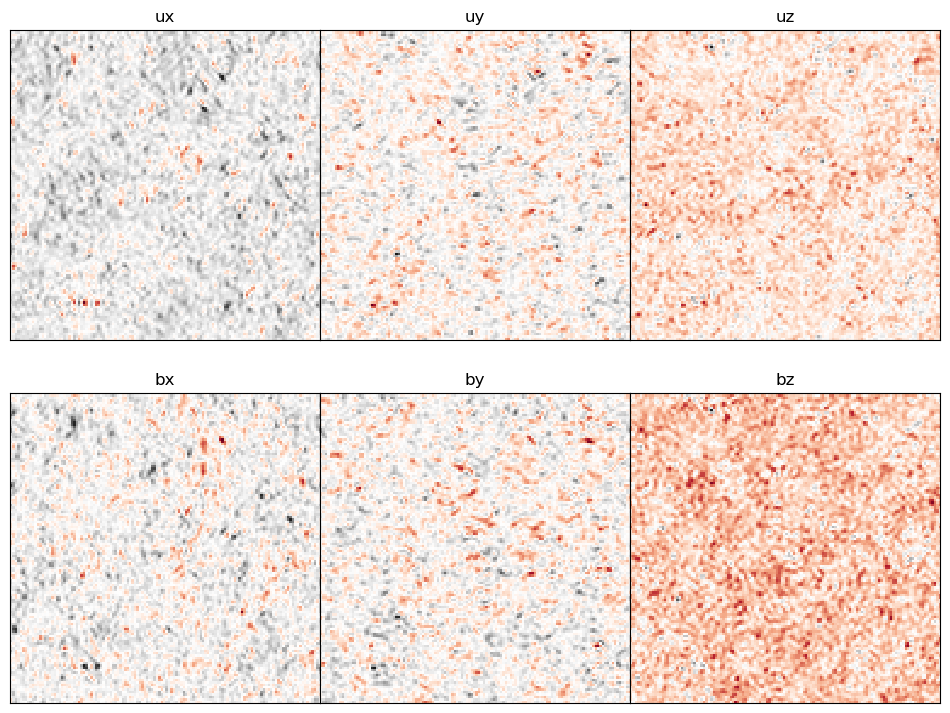

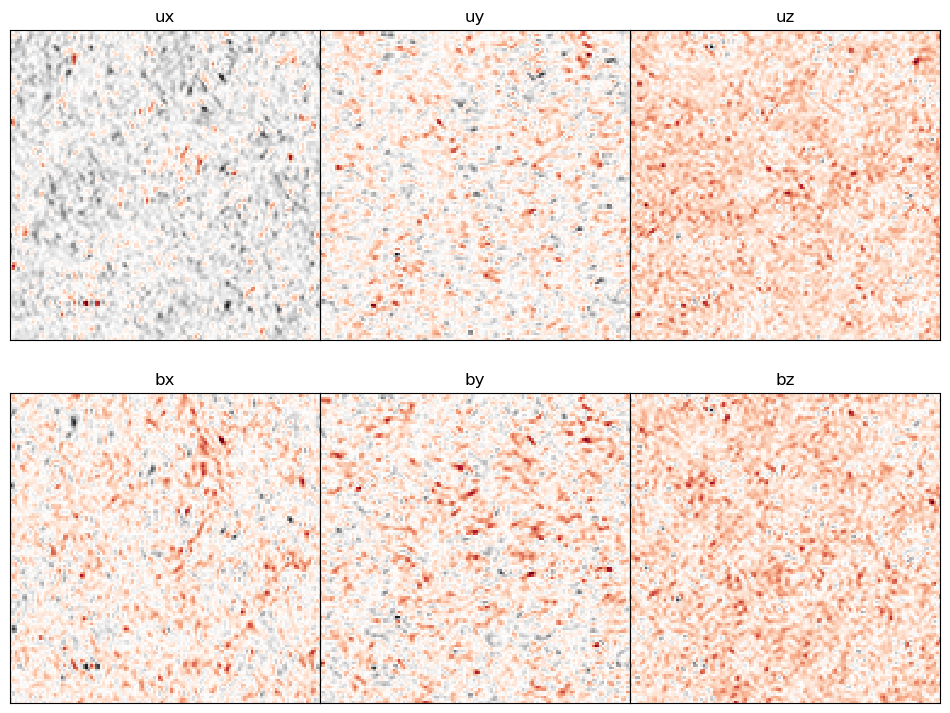

...

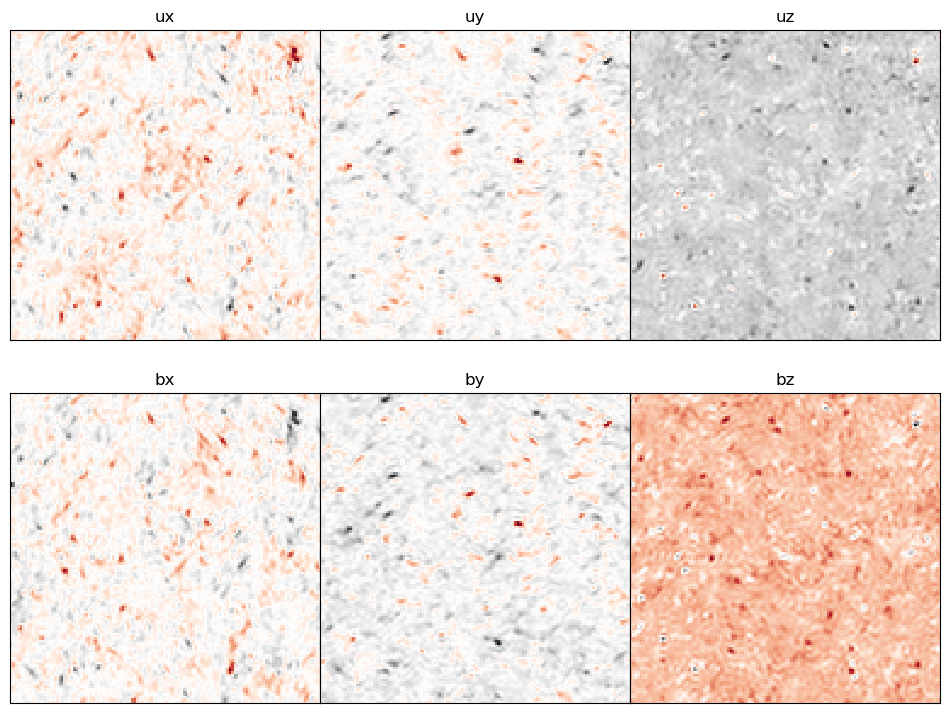

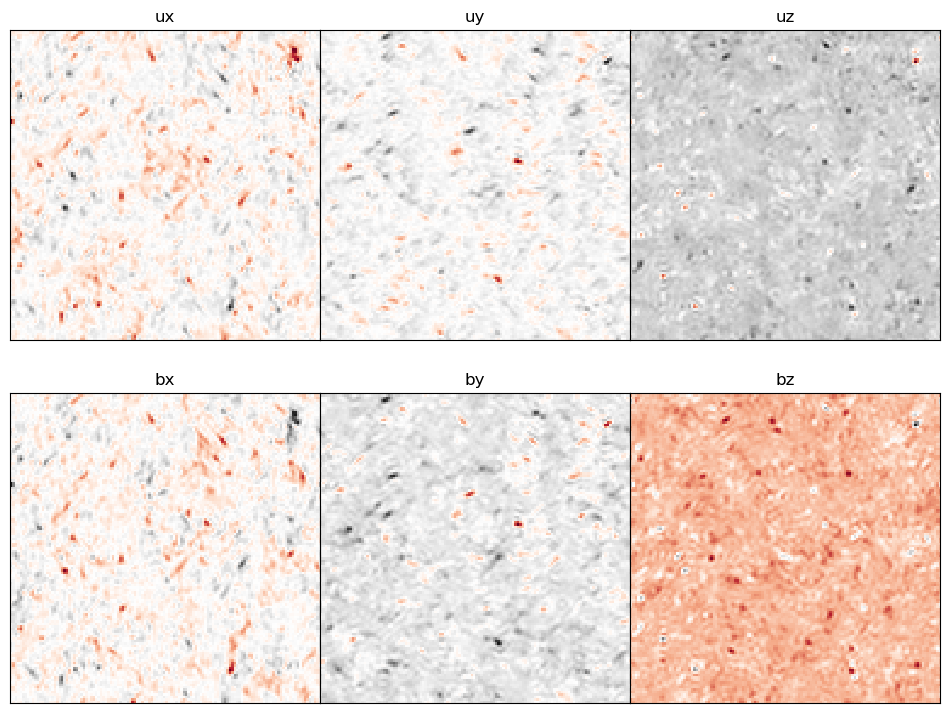

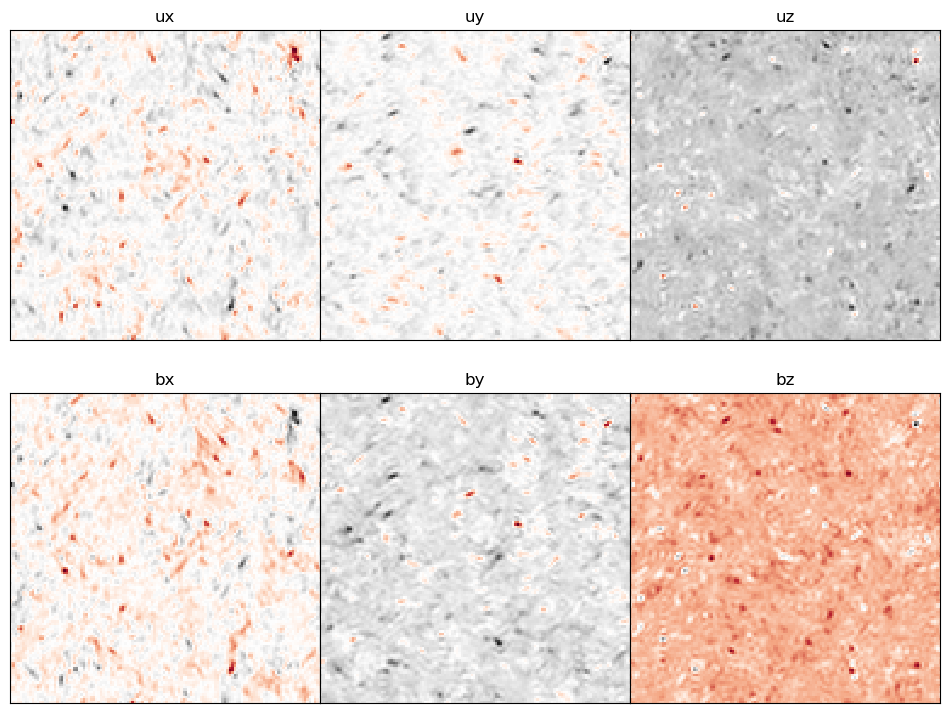

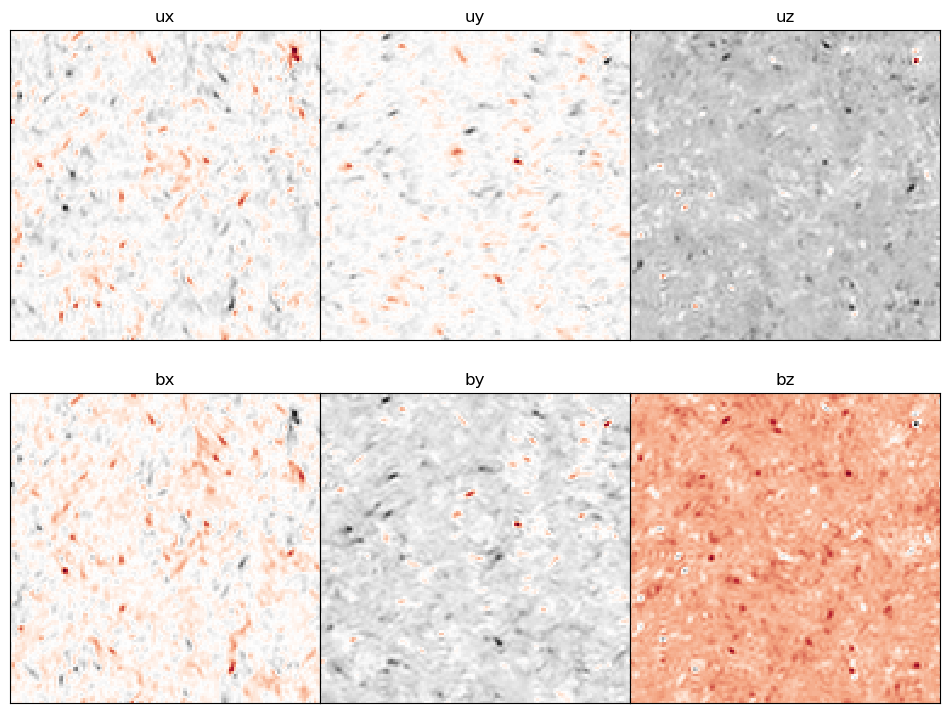

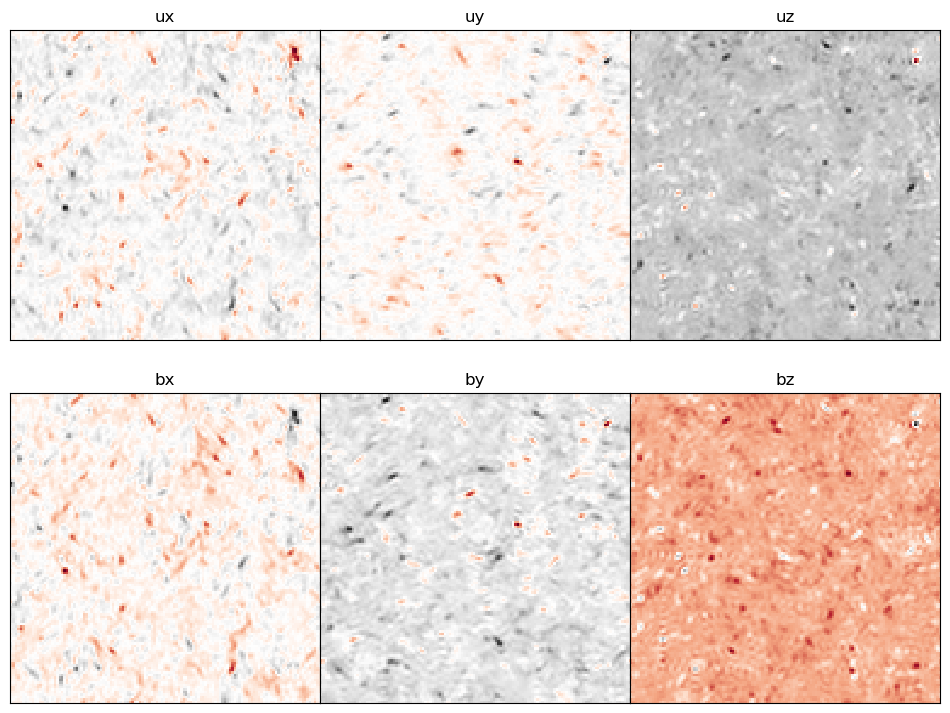

n cycle = 250,KE = 0.0006009520815377322ME = 0.0005580931288204877


In [26]:
j = 1;
uu,bb = [],[];
for i = 1:250
    updatevars!(prob);
    stepforward!(prob);
    u2,b2 = GetEnergy(prob);
    push!(uu,u2);
    push!(bb,b2);
    if i%10 == 0
       println("n cycle = ",i,",KE = ",u2/n^3,"ME = ",b2/n^3)  
       plotfigure(prob,j)
        j+=1;
    end
end

In [ ]:
for i = 1:1250
    updatevars!(prob);
    stepforward!(prob);
    u2,b2 = GetEnergy(prob);
    push!(uu,u2);
    push!(bb,b2);
    if i%10 == 0
       println("n cycle = ",i,",KE = ",u2/n^3,"ME = ",b2/n^3) 
       plotfigure(prob,j)
        j+=1;
    end
end

n cycle = 10,KE = 3.648406670910045e-5ME = 3.364429742825621e-5
n cycle = 20,KE = 3.5878490414954446e-5ME = 3.30726279507091e-5
n cycle = 30,KE = 3.5304239278022376e-5ME = 3.253103178402851e-5
n cycle = 40,KE = 3.4758623387445974e-5ME = 3.2016870149989836e-5
n cycle = 50,KE = 3.423925020783466e-5ME = 3.152781743145849e-5
n cycle = 60,KE = 3.37439838941821e-5ME = 3.1061814521316246e-5
n cycle = 70,KE = 3.327091315636145e-5ME = 3.061702892523294e-5
n cycle = 80,KE = 3.2818324981621566e-5ME = 3.019182156097665e-5
n cycle = 90,KE = 3.2384682207898375e-5ME = 2.9784719840673463e-5
n cycle = 100,KE = 3.196860376463551e-5ME = 2.9394396035877304e-5
n cycle = 110,KE = 3.156884701888409e-5ME = 2.901964966537986e-5
n cycle = 120,KE = 3.1184291938058104e-5ME = 2.8659392830931515e-5
n cycle = 130,KE = 3.0813926834836856e-5ME = 2.8312637797622024e-5
n cycle = 140,KE = 3.045683550808666e-5ME = 2.797848637844234e-5
n cycle = 150,KE = 3.0112185699027237e-5ME = 2.7656120776561475e-5
n cycle = 160,KE = 2.

In [83]:
t = collect(0:0.01:0.01*(length(uu)-1))
plot(t,uu);
plot(t,bb);

Figure(PyObject <Figure size 640x480 with 1 Axes>)

n cycle = 10,KE = 0.0011233928248846144ME = 0.0
n cycle = 20,KE = 0.0011195197415517339ME = 0.0
n cycle = 30,KE = 0.0011153777491711067ME = 0.0
n cycle = 40,KE = 0.0011108605042686682ME = 0.0
n cycle = 50,KE = 0.0011061745172172332ME = 0.0
n cycle = 60,KE = 0.0011012399422890193ME = 0.0
n cycle = 70,KE = 0.0010958806526507451ME = 0.0
n cycle = 80,KE = 0.0010899971454795547ME = 0.0
n cycle = 90,KE = 0.0010835127266034146ME = 0.0
n cycle = 100,KE = 0.0010766533812628571ME = 0.0
n cycle = 110,KE = 0.0010695716948947664ME = 0.0
n cycle = 120,KE = 0.0010622826014073283ME = 0.0
n cycle = 130,KE = 0.0010548590345047873ME = 0.0
n cycle = 140,KE = 0.0010474820658625688ME = 0.0
n cycle = 150,KE = 0.0010401848707061584ME = 0.0
n cycle = 160,KE = 0.0010329313561939424ME = 0.0
n cycle = 170,KE = 0.0010257797946494889ME = 0.0
n cycle = 180,KE = 0.0010186919614107413ME = 0.0
n cycle = 190,KE = 0.0010114788677073622ME = 0.0
n cycle = 200,KE = 0.0010040448502867047ME = 0.0
n cycle = 210,KE = 0.00099647

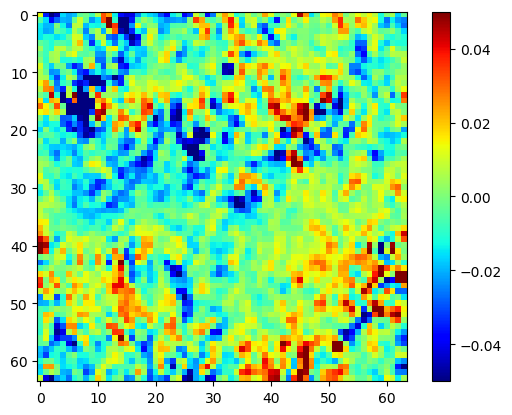

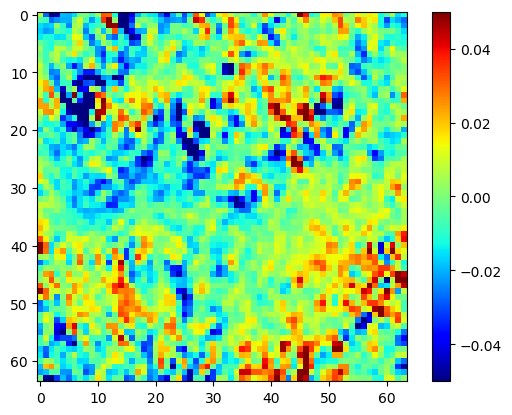

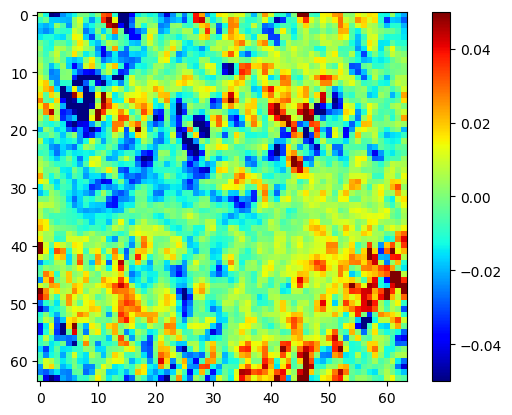

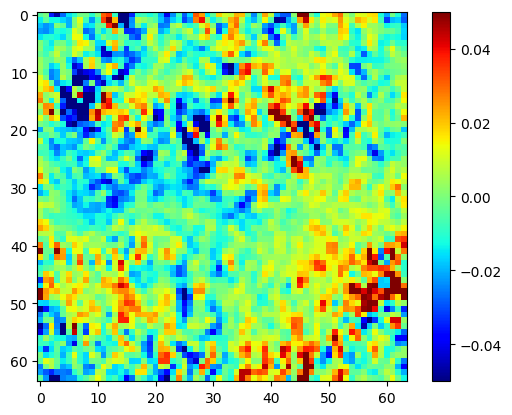

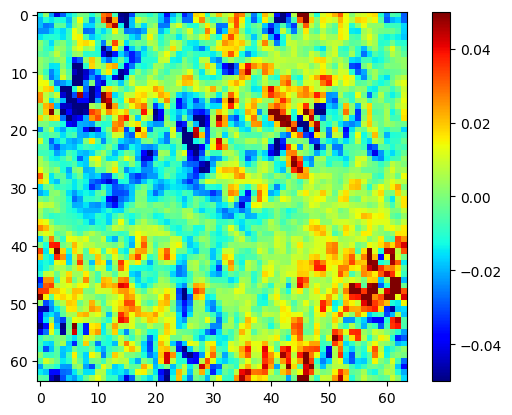

...

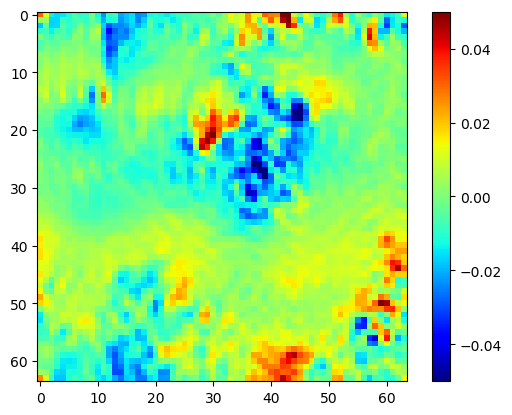

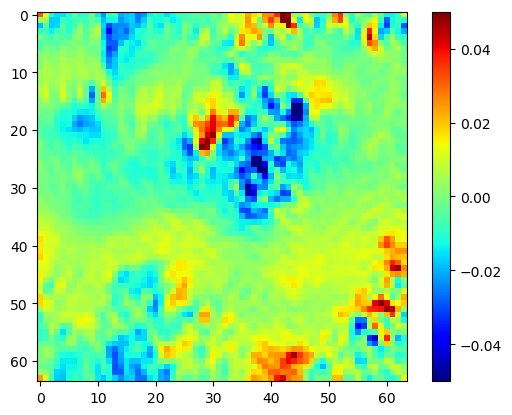

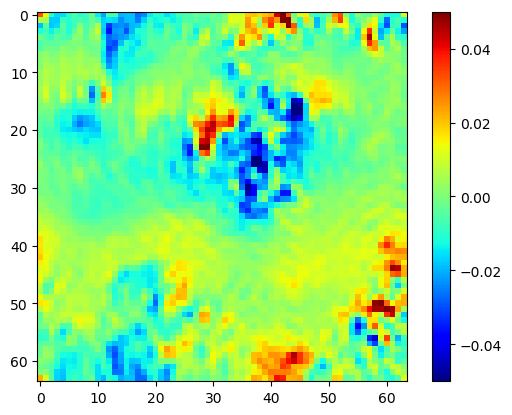

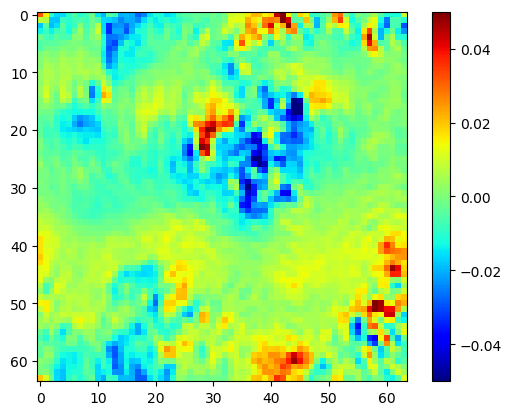

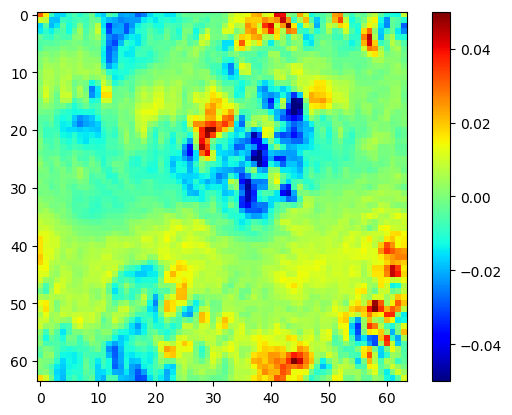

2500,KE = 0.0005434491960659007ME = 0.0


In [292]:
for i = 1:2500
    updatevars!(prob);
    stepforward!(prob);
    u2,b2 = GetEnergy(prob);
    push!(uu,u2);
    push!(bb,b2);
    if i%10 == 0
       println("n cycle = ",i,",KE = ",u2/n^3,"ME = ",b2/n^3) 
       figure()
       imshow(prob.vars.ux[:,:,1],cmap="jet",vmin=-0.05,vmax=0.05);
       colorbar()
    end
end